### Spatial mapping of human lung region snRNA-seq to Visium (for Elo) - with scVI non-amortised inference

In [1]:
import sys
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/scvi-tools/')

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl

#import cell2location
import scvi

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
import seaborn as sns

`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda4` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.

### Outline

1. Loading Visium data and single cell reference
2. Show UMAP of cells and locations
3. cell2location analysis in one step
4. Automatic discrete region identification by clustering cell densities
5. Visualize cell type density gradients using diffusion maps
6. Identify co-occuring cell type combinations using matrix factorisation



## 1. Loading Visium data and single cell reference

First let's read spatial Visium data from 10X Space Ranger output. Here we load sample annotations.

In [2]:
sp_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/lung_airway_km/regions_with_visium_all/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/lung_airway_km/'
results_folder = '/nfs/team205/vk7/sanger_projects/collaborations/adult_lung_mapping/results/'
gut_results_folder = '/nfs/team205/vk7/sanger_projects/collaborations/fetal_gut_mapping/results/'
scvi_ref_run_name = f'{results_folder}/non_amortised/v0_Adam_4000iter_snsc_selection_CCLplasma_ref'
scvi_gut_ref_run_name = f'{gut_results_folder}regression_model/v1_ye_signatures_lr0002_Adam'

scvi_run_name = f'{results_folder}/non_amortised/v3_nonamortised_Adam_alpha20_40k_lr0002_CCLplasma_long_ref_wo_lowQ_gutFDC_GC'

annotation_folder = '/nfs/team205/vk7/sanger_projects/collaborations/adult_lung_mapping/data/Loupe_annotations/'

sample_name = pd.Series(['WSA_LngSP8759311', 'WSA_LngSP8759312', 'WSA_LngSP8759313', 'WSA_LngSP9258463', 
                         'WSA_LngSP9258467', 'WSA_LngSP9258464', 'WSA_LngSP9258468', 'WSA_LngSP10193345', 
                         'WSA_LngSP10193346', 'WSA_LngSP10193347', 'WSA_LngSP10193348'
                        ])

Next we load the mRNA count for each Visium slide and corresponding histology images as a list `slides` and as a single anndata object `adata`. We need this redundancy because scanpy plotting over the histology image does not work with multiple sections.   

In [3]:
def read_and_qc(sample_name, path=sp_data_folder + 'rawdata/'):
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']
    
    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    return adata

# read first sample
adata = read_and_qc(sample_name[0],
                    path=sp_data_folder + 'rawdata/') 

# read the remaining samples
slides = {}
for i in sample_name[1:]:
    adata_1 = read_and_qc(i, path=sp_data_folder + 'rawdata/') 
    slides[str(i)] = adata_1

adata_0 = adata.copy()
    
# combine individual samples
#adata = adata.concatenate(list(slides.values()), index_unique=None)
adata = adata.concatenate(
    list(slides.values()),
    batch_key="sample",
    uns_merge="unique",
    batch_categories=sample_name, 
    index_unique=None
)

def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :].copy()
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide


slides[str(sample_name[0])] = adata_0

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Vari

In [4]:
# read histology-based annotations:
from glob import glob
from re import sub
annotations = []
for s in adata.obs['sample'].unique():
    annotation_files = glob(f'{annotation_folder}{s}/*csv')
    annotation_cols = [sub('^.+/', '', i)for i in annotation_files]
    annotation_cols = [sub('\.csv$', '', i)for i in annotation_cols]
    annotation_cols_clean = [sub(' ', '_', i)for i in annotation_cols]
    annotations = annotations + annotation_cols_clean

    for i, f in enumerate(annotation_files):
        
        annot_ = pd.read_csv(f, index_col='Barcode')
        annot_.index = [f'{s}_{i}' for i in annot_.index]
        
        if annotation_cols_clean[i] not in adata.obs.columns:
            adata.obs[annotation_cols_clean[i]] = ''

        adata.obs.loc[annot_.index, annotation_cols_clean[i]] = annot_[annotation_cols[i]]
    
annotations = np.unique(annotations)
adata.obs['Tissue'].value_counts(dropna=False), adata.obs['Weird_morphology'].value_counts(dropna=False), annotations

(1.0    20770
 NaN     1773
 Name: Tissue, dtype: int64,
        11399
 NaN     9898
 1.0     1246
 Name: Weird_morphology, dtype: int64,
 array(['Airway_Smooth_Muscle', 'Arterial_vessel', 'Cartilage', 'Glands',
        'Mesothelium', 'Multilayer_epithelium', 'Nerve', 'Parenchyma',
        'Perichondrium', 'Pulmonary_vessel', 'Small_airway', 'Tissue',
        'Venous_vessel', 'Weird_morphology', 'iBALT'], dtype='<U21'))

In [5]:
# select locations from good quality tissue:
tissue_ind = adata.obs['Tissue'].isin([1.0])
print(sum(tissue_ind))

adata = adata[tissue_ind, :]
adata.obs['Tissue'].value_counts(dropna=False)

20770


/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


1.0    20770
Name: Tissue, dtype: int64

Now let's look at QC: total number of counts and total number of genes per spot

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


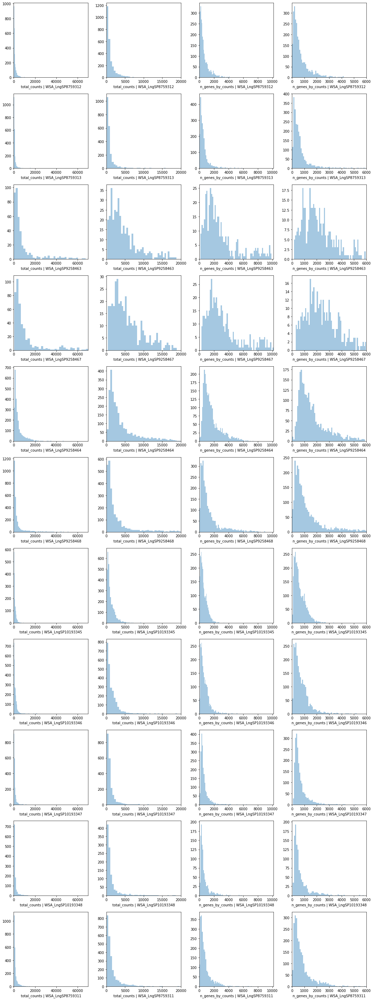

In [6]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i in range(len(slides)):
    #fig.suptitle('Covariates for filtering')
    
    sns.distplot(list(slides.values())[i].obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['total_counts']\
                 [list(slides.values())[i].obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts']\
                 [list(slides.values())[i].obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    plt.tight_layout()

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP10193345


... storing 'SYMBOL' as categorical


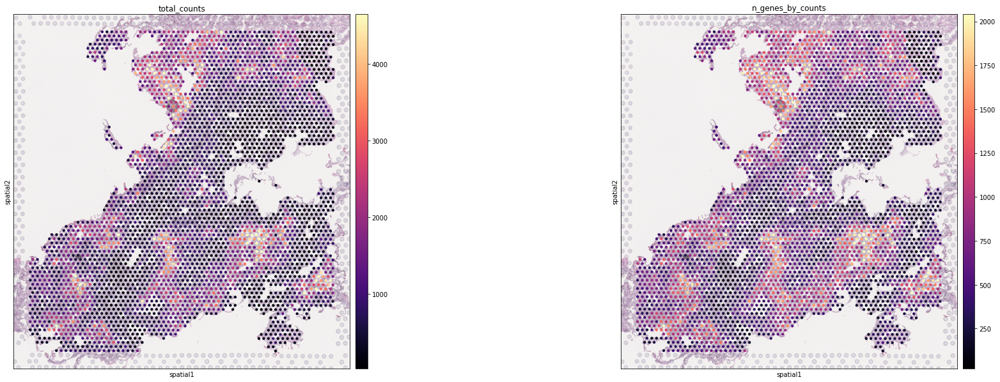

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP10193346


... storing 'SYMBOL' as categorical


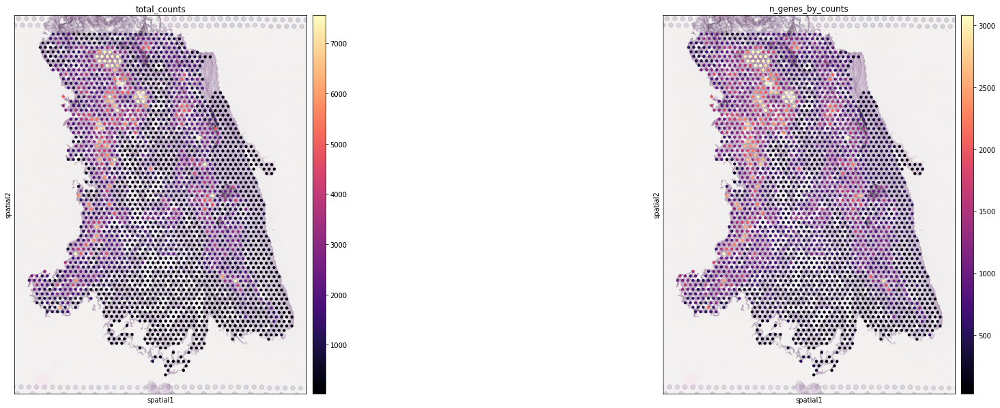

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP10193347


... storing 'SYMBOL' as categorical


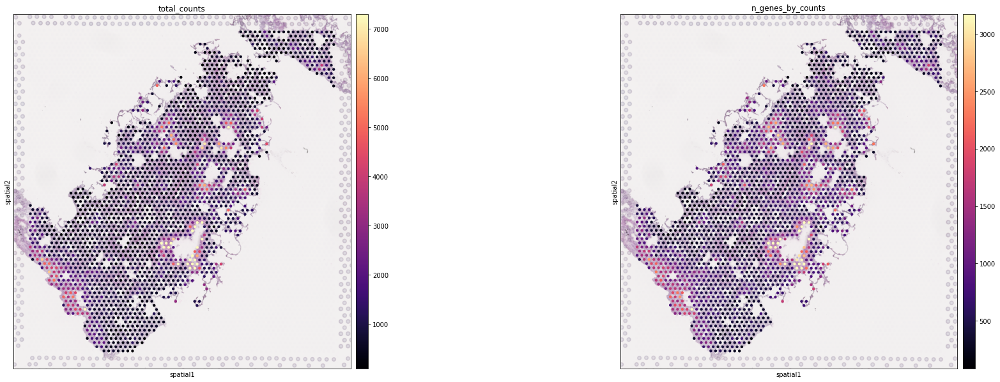

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP10193348


... storing 'SYMBOL' as categorical


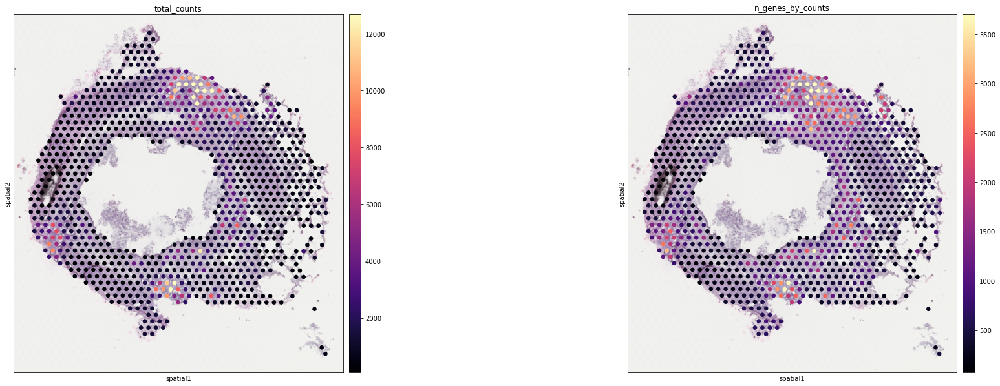

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP8759311


... storing 'SYMBOL' as categorical


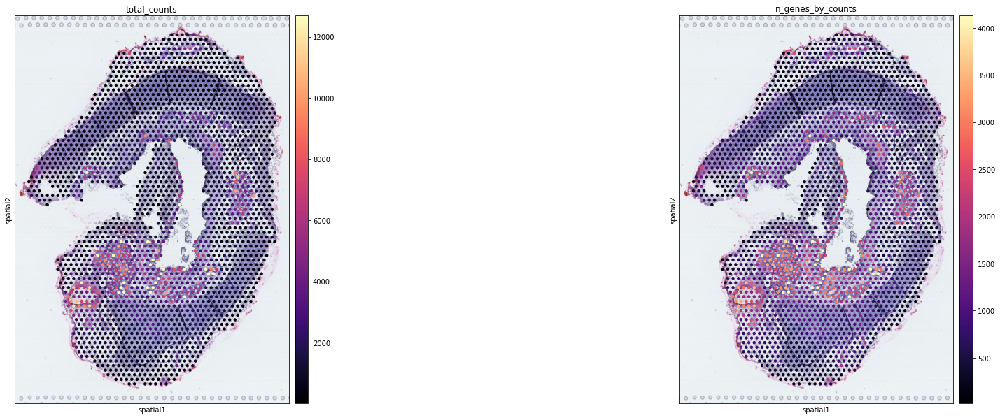

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP8759312


... storing 'SYMBOL' as categorical


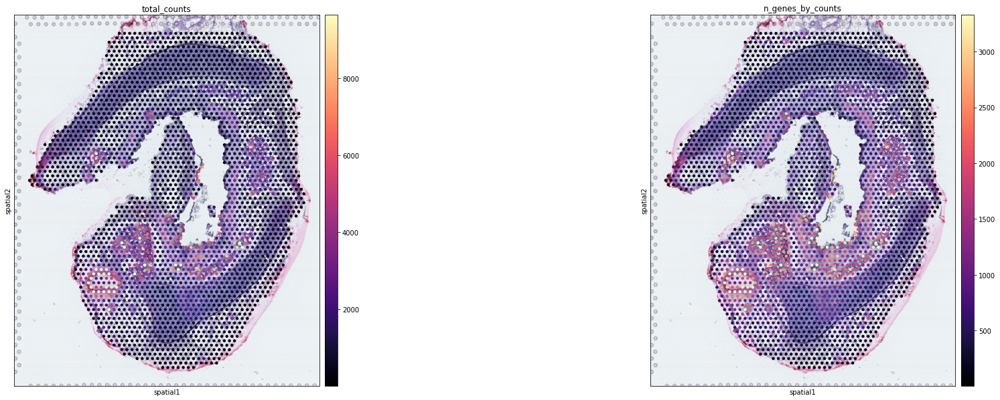

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP8759313


... storing 'SYMBOL' as categorical


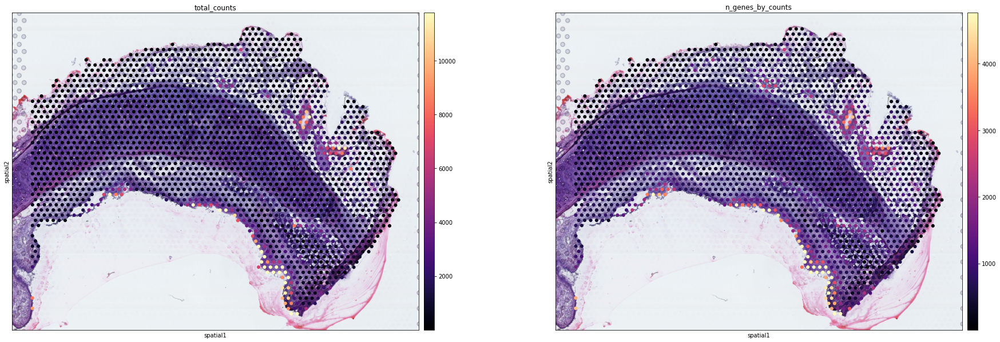

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP9258463


... storing 'SYMBOL' as categorical


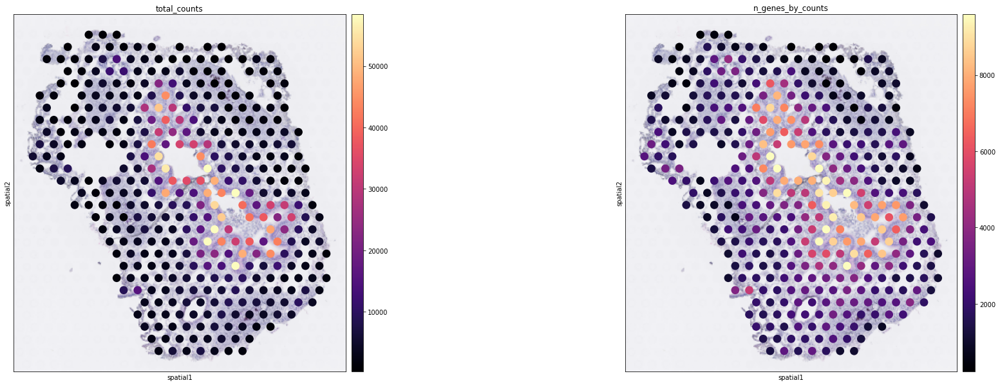

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP9258464


... storing 'SYMBOL' as categorical


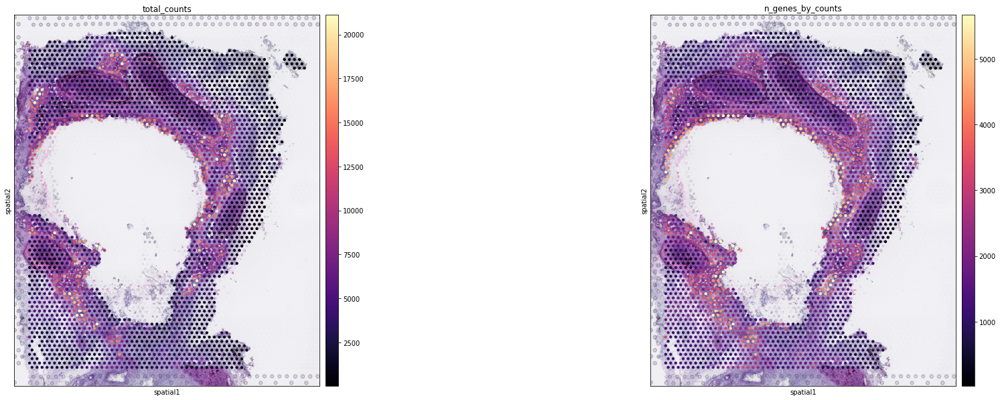

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP9258467


... storing 'SYMBOL' as categorical


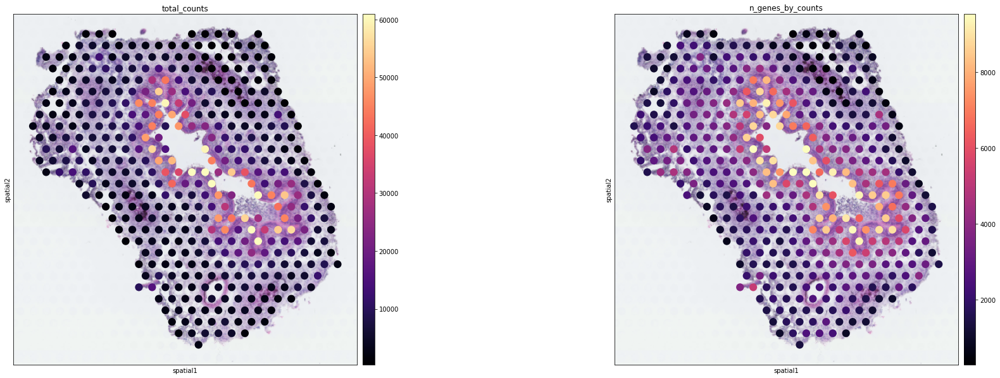

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

WSA_LngSP9258468


... storing 'SYMBOL' as categorical


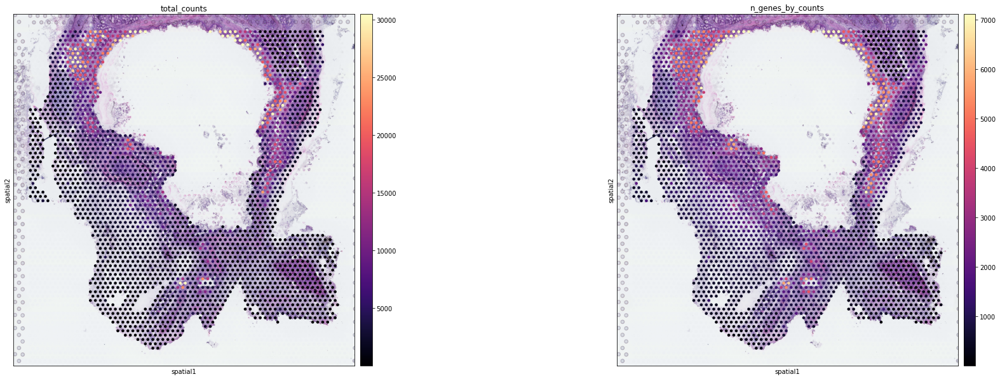

In [7]:
for s in np.unique(adata.obs['sample']):
    slide = select_slide(adata, s)
    print(s)
    with mpl.rc_context({'figure.figsize': (15, 10)}):
        sc.pl.spatial(slide, img_key = "hires", cmap='magma',
                      color=['total_counts', 'n_genes_by_counts'], size=0.9,
                      vmax='p99.0',
                      gene_symbols='SYMBOL')

Here we show how to use scanpy to plot results over histology section using anndata object from one section, and 

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
... storing 'Perichondrium' as categorical
... storing 'Weird_morphology' as categorical
... storing 'Cartilage' as categorical
... storing 'Glands' as categorical
... storing 'Tissue' as categorical
... storing 'Multilayer_epithelium' as categorical
... storing 'Nerve' as categorical
... storing 'Venous_vessel' as categorical
... storing 'Airway_Smooth_Muscle' as categorical
... storing 'Arterial_vessel' as categorical
... storing 'Parenchyma' as categorical
... storing 'Pulmonary_vessel' as categorical
... storing 'Mesothelium' as categorical
... storing 'Small_airway' as categorical
... storing 'iBALT' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categor

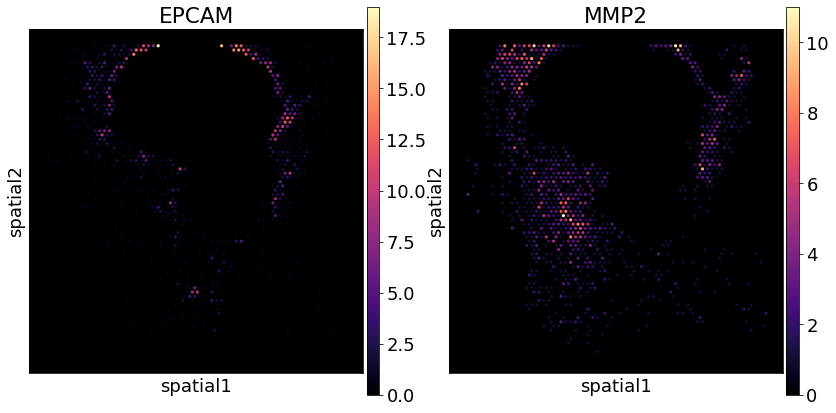

In [8]:
rcParams["axes.facecolor"] = "black"
rcParams["figure.figsize"] = [6,7]
rcParams["font.size"] = 18

slide = select_slide(adata, s)
sc.pl.spatial(slide, 
              color=["EPCAM", "MMP2"], img_key=None,
              vmin=0, cmap='magma', #vmax=3.8,
              gene_symbols='SYMBOL'
             )

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'Perichondrium' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Weird_morphology' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Cartilage' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Glands' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Tissue' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Multilayer_epithelium' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Nerve' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Venous_vessel' as categorical
Trying to set attribute `.obs` of view, cop

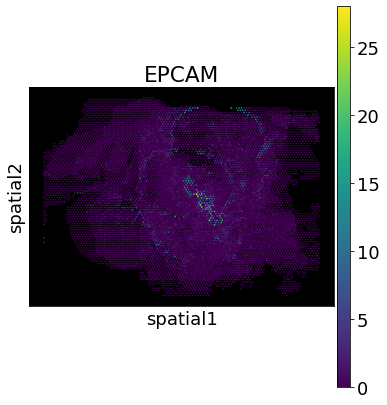

In [10]:
sc.pl.spatial(adata, 
              color=["EPCAM"], img_key=None,
              vmin=0, library_id='WSA_LngSP9258467',
              gene_symbols='SYMBOL'
             )

In [11]:
adata_vis = adata.copy()
#adata_vis.var_names = adata_vis.var['SYMBOL']
#adata_vis.var_names.name = 'index'
adata_vis.raw = adata_vis

## 2. Show UMAP of cells and locations

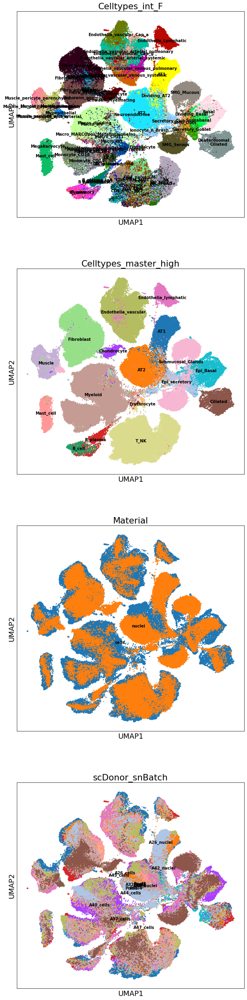

In [12]:
#mod = scvi.external.cell2location.RegressionModel.load(f"{scvi_run_name}_snsc_selection_ref", adata_snrna_raw)
adata_file = f"{scvi_ref_run_name}/sc.h5ad"
adata_snrna_raw = sc.read_h5ad(adata_file)

# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_snrna_raw.varm.keys():
    inf_aver = adata_snrna_raw.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' 
                                    for i in adata_snrna_raw.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_snrna_raw.var[[f'means_per_cluster_mu_fg_{i}' 
                                    for i in adata_snrna_raw.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_snrna_raw.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]

rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_snrna_raw, color=['Celltypes_int_F', 'Celltypes_master_high', 
                                   'Material', 'scDonor_snBatch'],
           color_map = 'RdPu', ncols = 1, legend_loc='on data',
           size=30,
           legend_fontsize=10)

In [13]:
#mod = scvi.external.cell2location.RegressionModel.load(f"{scvi_run_name}_snsc_selection_ref", adata_snrna_raw)
gut_adata_file = f"{scvi_gut_ref_run_name}/sc.h5ad"
gut_adata_snrna_raw = sc.read_h5ad(gut_adata_file)

# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in gut_adata_snrna_raw.varm.keys():
    gut_inf_aver = gut_adata_snrna_raw.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}' 
                                    for i in gut_adata_snrna_raw.uns['mod']['factor_names']]].copy()
else:
    gut_inf_aver = gut_adata_snrna_raw.var[[f'means_per_cluster_mu_fg_{i}' 
                                    for i in gut_adata_snrna_raw.uns['mod']['factor_names']]].copy()
gut_inf_aver.columns = gut_adata_snrna_raw.uns['mod']['factor_names']

gut_inf_aver = gut_inf_aver.reindex(index=inf_aver.index)
gut_inf_aver[gut_inf_aver.isna()] = 0.0003
gut_inf_aver.iloc[0:5, 0:5]

,Activated CD4 T,Activated CD8 T,Adult Glia,BEST2+ Goblet cell,BEST4+ epithelial
ENSG00000187634,0.000475,0.000341,0.008211,0.001663,0.001148
ENSG00000188976,0.056281,0.082341,0.061379,0.256258,0.149516
ENSG00000188290,0.041080,0.058555,0.128032,0.130205,1.816961
ENSG00000187608,0.123889,0.235275,0.197328,0.110768,0.701299
ENSG00000188157,0.000658,0.001535,0.071497,0.121496,0.181480


In [14]:
# add FDC and GC populations from gut reference
lymphoid_list = ['DZ GC cell', 'FDC', 'GC B cell', 'LZ GC cell', 'T reticular', 'Tfh']

for l in lymphoid_list:
    inf_aver[l] = gut_inf_aver[l]

/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


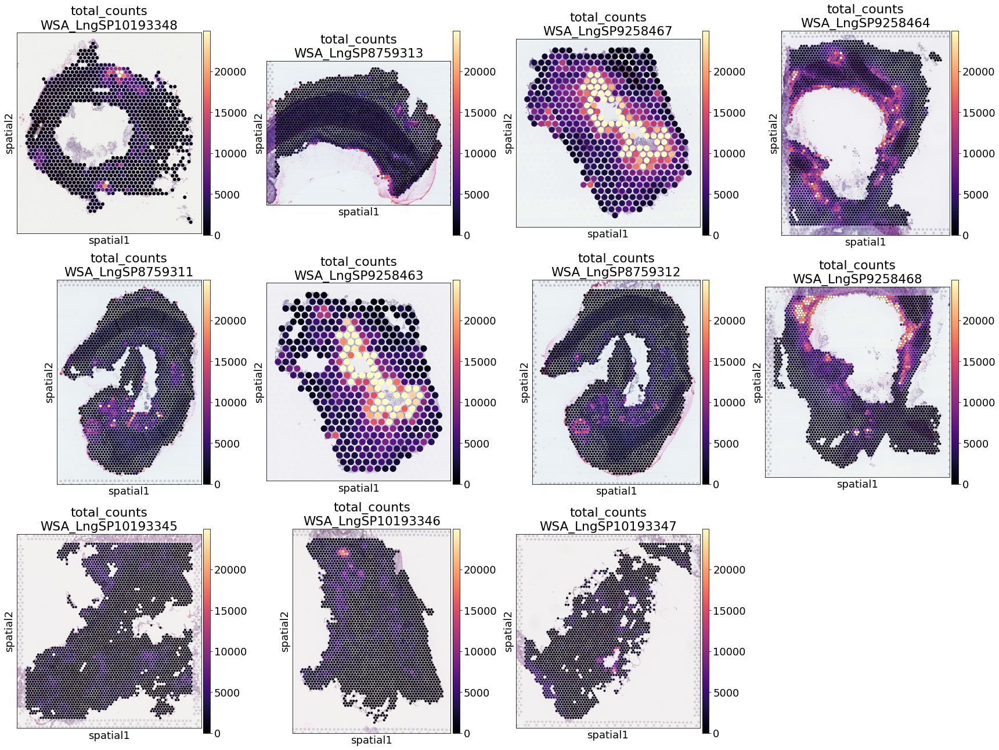

In [15]:
def plot_spatial_per_cell_type(adata, 
                               cell_type='total_counts',
                               samples=[
       'WSA_LngSP10193348', 'WSA_LngSP8759311', 'WSA_LngSP10193345',
                                    
       'WSA_LngSP8759313', 'WSA_LngSP9258463', 'WSA_LngSP10193346',
                                   
       'WSA_LngSP9258467', 'WSA_LngSP8759312', 'WSA_LngSP10193347',
                                   
       'WSA_LngSP9258464', 'WSA_LngSP9258468',
                               ],
                              ncol=4, prefix='', figsize=(24, 18),
                              vmax_quantile=0.992):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=figsize)
    if nrow == 1:
        axs = axs.reshape((1, ncol))
    
    col_name = f'{prefix}{cell_type}'
    vmax = np.quantile(adata_vis.obs[col_name].values, vmax_quantile)
    adata_vis.obs[cell_type] = adata_vis.obs[col_name].copy()
    
    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))
    
    for i, s in enumerate(samples):
        sp_data_s = select_slide(adata, s, s_col='sample')
        sc.pl.spatial(sp_data_s, cmap='magma',
                      color=cell_type, 
                      size=1.3, img_key='hires', alpha_img=1,
                      vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                            )
        axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)
        
    if len(samples) < len(axs.flatten()):
        for i in range(len(samples), len(axs.flatten())):
            axs[ind[i][0],ind[i][1]].axis('off')
        
    fig.tight_layout(pad=0.5)
        
    return fig

plot_spatial_per_cell_type(adata_vis, cell_type='total_counts');

# 3. cell2location analysis in one step

Here we show how to perform the first step in one function run - train cell2location model to learn cell locations. Results are shown below and saved to:  

In [16]:
results_folder

'/nfs/team205/vk7/sanger_projects/collaborations/adult_lung_mapping/results/'

### Train scvi-cell2location

In [17]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for scVI model
scvi.data.setup_anndata(adata=adata_vis, batch_key="sample")
scvi.data.view_anndata_setup(adata_vis)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              


/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/ca

INFO     Successfully registered anndata object containing 20770 cells, 12912 vars, 11       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [18]:
from scvi.external.cell2location._cell2location_v3_module import LocationModelLinearDependentWMultiExperimentLocationBackgroundNormLevelGeneAlphaPyroModel

In [ ]:
# create and train the model
import pyro
mod = scvi.external.Cell2location(
    adata_vis, cell_state_df=inf_aver, 
    model_class=LocationModelLinearDependentWMultiExperimentLocationBackgroundNormLevelGeneAlphaPyroModel,
    amortised=False,# encoder_mode="single-multiple",
    #encoder_kwargs={'dropout_rate': 0.2},
    # the expected average cell abundance - user-provided, tissue-dependent hyper-prior:
    N_cells_per_location=20,
    detection_alpha=20.0,#detection_alpha,
    #detection_hyp_prior={"alpha": 20.0, "mean": 1.0, "mean_alpha": 1.0},
) 

mod.train(max_epochs=40000, 
          batch_size=None, 
          #plan_kwargs={"optim_kwargs": {"lr": 0.003, "clip_norm": 10}},
          #plan_kwargs={'optim': pyro.optim.ClippedAdam(optim_args={'lr': 0.003, 'clip_norm': 10})},
          plan_kwargs={'optim': pyro.optim.Adam(optim_args={'lr': 0.002})},
          train_size=1,
          use_gpu=True)

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(10000)
plt.legend(labels=['full data']);

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
/nfs/team283/vk7/software/miniconda3farm5/envs/scvi-env2/lib/python3.7/site-packages/pytorch_lightning/utilities/distributed.py:69: UserWarning: you passed in a val_dataloader but have no validation_step. Skipping val loop
  warnings.warn(*args, **kwargs)
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 11256/40000:  28%|██▊       | 11255/40000 [51:29<2:13:36,  3.59it/s, v_num=1, elbo_train=5.93e+7]

In [ ]:
mod.detection_mean_

In [ ]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

# Save model
mod.save(f"{scvi_run_name}", overwrite=True)
# can be loaded later like this:
# mod = scvi.external.Cell2location.load(f"{scvi_run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{scvi_run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

In [ ]:
# Examine reconstruction accuracy to assess if there are any issues with mapping
# the plot should be roughly diagonal, strong deviations will signal problems
mod.plot_QC()

In [ ]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

In [ ]:
plot_spatial_per_cell_type(adata_vis, cell_type=adata_vis.uns['mod']['factor_names'][0]);

In [ ]:
from re import sub
import os
for c in adata_vis.uns['mod']['factor_names']:
    fig = plot_spatial_per_cell_type(adata_vis, cell_type=c)
    fig_dir = f"{scvi_run_name}/spatial/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig_dir = f"{scvi_run_name}/spatial/per_cell_type/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig.savefig(f"{fig_dir}W_cell_abundance_q05_{sub('/', '_', c)}.png",
                bbox_inches='tight')
    fig.clear()
    plt.close(fig)

f"{scvi_run_name}/spatial/per_cell_type/"


In [ ]:
from re import sub
import os
for c in adata_vis.uns['mod']['factor_names']:
    fig = plot_spatial_per_cell_type(adata_vis, cell_type=c, vmax_quantile=0.9999)
    fig_dir = f"{scvi_run_name}/spatial/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig_dir = f"{scvi_run_name}/spatial/per_cell_type/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig.savefig(f"{fig_dir}W_cell_abundance_q05_{sub('/', '_', c)}_p9999.png",
                bbox_inches='tight')
    fig.clear()
    plt.close(fig)

f"{scvi_run_name}/spatial/per_cell_type/"


In [ ]:
with mpl.rc_context({"axes.facecolor": "black"}):
    clust_names = adata_vis.uns['mod']['factor_names']
    
    for s in adata_vis.obs['sample'].unique():

        s_ind = adata_vis.obs['sample'] == s
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]

        fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                            color=clust_names, ncols=5, library_id=s_spatial,
                            size=1.3, img_key='hires', alpha_img=1,
                            vmin=0, vmax='p99.2',
                            return_fig=True, show=False)
        
        fig_dir = f"{scvi_run_name}/spatial/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        fig_dir = f"{scvi_run_name}/spatial/per_sample/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)

        plt.savefig(f"{fig_dir}W_cell_abundance_q05_{s}.png",
                    bbox_inches='tight')
        plt.close()

In [ ]:
# compare this parameter to nUMI 
with mpl.rc_context({'axes.facecolor': 'white', 'font.size': 10, 
                            'figure.figsize': [5, 5]}):
    detection_eff_y_s = adata_vis.uns['mod']['post_sample_means']['detection_y_s'].flatten()
    total_UMI = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1)
    cor = np.corrcoef(detection_eff_y_s, total_UMI)[0, 1]
    from scipy.stats import spearmanr
    cor_spearmanr = spearmanr(detection_eff_y_s, total_UMI)
    
    plt.scatter(detection_eff_y_s, total_UMI,
                s=0.1);
    plt.xlabel('Detection efficiency normalisation parameter y_s');
    plt.ylabel('Total cell abundance per location');
    plt.title(f'$R^2$ {np.round(cor, 2)}, Spearman: {np.round(np.array(cor_spearmanr)[0], 2)}')

In [ ]:
# look at the location detection efficiency parameter for each experiment
with mpl.rc_context({'axes.facecolor': 'white', 'font.size': 10, 
                            'figure.figsize': [5, 15]}):
    for i, n in enumerate(adata_vis.obs['sample'].unique()):
        plt.subplot(len(adata_vis.obs['sample'].unique()), 1, i+1)
        x = adata_vis.uns['mod']['post_sample_means']['detection_y_s'].flatten()
        x = x[adata_vis.obs['sample'] == n]
        plt.hist(x, bins=100);
        plt.title(n)
        plt.xlim(0, adata_vis.uns['mod']['post_sample_means']['detection_y_s'].max())

In [ ]:
# look at the total cell abundance for each experiment
with mpl.rc_context({'axes.facecolor': 'white', 'font.size': 10, 
                            'figure.figsize': [5, 15]}):
    for i, n in enumerate(adata_vis.obs['sample'].unique()):
        plt.subplot(len(adata_vis.obs['sample'].unique()), 1, i+1)
        total_cell_abundance = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()
        total_cell_abundance_ = total_cell_abundance[adata_vis.obs['sample'] == n]
        plt.hist(total_cell_abundance_, bins=100);
        plt.title(n)
        plt.xlim(0, total_cell_abundance.max())

In [ ]:
#adata_vis.uns['mod']['post_sample_means']['m_g_mean'], 
adata_vis.uns['mod']['post_sample_means']['m_g'].mean()

In [ ]:
# compute KNN using the cell2location output
sc.pp.neighbors(adata_vis, use_rep='q05_cell_abundance_w_sf',
                n_neighbors = 20, metric='correlation')

# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=0.7)

adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
adata_vis.obs["region_cluster"] = adata_vis.obs["region_cluster"].astype("category")


sc.tl.umap(adata_vis, min_dist = 0.2, spread = 1.5)

sc.settings.figdir = f"{scvi_run_name}/"

#del adata_vis.uns['region_cluster_colors']

rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_vis, color=['sample', 'region_cluster'],
           color_map = 'RdPu', ncols = 2, legend_loc='on data',
           legend_fontsize=10, size=20, save='umap_region_cluster.pdf')

# Plot locations of clusters
rcParams["figure.figsize"] = [10, 10]
rcParams["axes.facecolor"] = "white"

for s in list(adata_vis.obs["sample"].unique()):
    slide = select_slide(adata_vis, s)
    sel_clust = adata_vis.obs['region_cluster'].cat.categories.isin(slide.obs['region_cluster'].cat.categories)
    slide.uns['region_cluster_colors'] = list(np.array(adata_vis.uns['region_cluster_colors'])[sel_clust])
    sc.pl.spatial(slide, #library_id=s,
                  color=["region_cluster"], img_key='hires', size=1,
                  #palette=adata_vis.uns['region_cluster_colors']
                );

### Export regions for import to 10X Loupe Browser
# add binary labels for each region
region_cluster_bin = adata_vis.obs[['region_cluster']]
# save maps for each sample separately
sam = np.array(adata_vis.obs['sample'])

for i in np.unique(sam):
    
    s1 = region_cluster_bin
    s1 = s1.loc[sam == i]
    s1.index = [x[10:] for x in s1.index]
    s1.index.name = 'Barcode'
    
    s1.to_csv(f"{scvi_run_name}/"\
              +'/region_cluster29_' + i + '.csv')

In [ ]:
rcParams['figure.figsize'] = 4.5, 4.5
plt.hist2d(adata_vis.uns['mod']['post_sample_q05']['n_s_cells_per_location'].flatten(),
           adata_vis.uns['mod']['post_sample_q05']['y_s_groups_per_location'].flatten(),
           bins=80, norm=mpl.colors.LogNorm());
plt.xlabel('n_s_cells_per_location');
plt.ylabel('y_s_groups_per_location');
plt.show()

plt.hist2d(adata_vis.uns['mod']['post_sample_q05']['n_s_cells_per_location'].flatten(),
           adata_vis.uns['mod']['post_sample_q05']['w_sf'].sum(1).flatten(),
           bins=80, norm=mpl.colors.LogNorm());
plt.xlabel('n_s_cells_per_location');
plt.ylabel('sum_f(w_sf)');
plt.savefig(f"{scvi_run_name}/n_s_vs_w_sf.pdf");
plt.show()

plt.hist2d(adata_vis.uns['mod']['post_sample_q05']['y_s_groups_per_location'].flatten(),
           adata_vis.uns['mod']['post_sample_q05']['w_sf'].sum(1).flatten(),
           bins=80, norm=mpl.colors.LogNorm());
plt.xlabel('y_s_groups_per_location');
plt.ylabel('sum_f(w_sf)');
plt.show()

#plt.hist2d(adata_vis.uns['mod']['post_sample_q05']['detection_eff_y_s'].flatten(),
#           adata_vis.uns['mod']['post_sample_q05']['spot_factors'].sum(1).flatten(),
#           bins=80, norm=mpl.colors.LogNorm());
#plt.xlabel('detection_eff_y_s');
#plt.ylabel('sum(spot_factors)');
#plt.savefig(f"{results_folder}/{r['run_name']}/y_s_vs_w_sf.pdf");
#plt.show()

In [ ]:
plot_spatial_per_cell_type(adata_vis, cell_type=adata_vis.uns['mod']['factor_names'][0]);

In [ ]:
adata_vis.obs['total_spot_factors'] = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()
plot_spatial_per_cell_type(adata_vis, cell_type='total_spot_factors', prefix='');

In [ ]:
adata_vis.obs['detection_y_s'] = adata_vis.uns['mod']['post_sample_q05']['detection_y_s']
plot_spatial_per_cell_type(adata_vis, cell_type='detection_y_s', prefix='');

In [ ]:
plot_spatial_per_cell_type(adata_vis, cell_type='total_counts', prefix='');

Modules and their versions used for this analysis

In [ ]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass